<a href="https://colab.research.google.com/github/T0n-k4/Ugliest-Nightmare-Prettiest-Dream/blob/main/Final_Project_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
# Importing the required libraries
import matplotlib.pyplot as plt  # For plotting graphs and images
import imageio  # For reading and writing a wide range of image data
import torch  # PyTorch library for tensor computations
import torchvision  # PyTorch library for computer vision tasks
from torchvision import models, transforms  # Specific modules from torchvision
import numpy as np  # NumPy for numerical computations
from torchvision.models import *  # Importing all models from torchvision
from PIL import Image  # Python Imaging Library for handling images
import requests  # For making HTTP requests
from torchvision import models  # Importing models again (redundant)
from torchsummary import summary  # For summarizing PyTorch models

In [ ]:
def plot(x):
    # Create a figure and axis
    fig, ax = plt.subplots()
    # Display the image 'x' using a grayscale colormap
    im = ax.imshow(x, cmap='gray')
    # Turn off axis labels
    ax.axis('off')
    # Set the figure size to 20x20 inches
    fig.set_size_inches(20, 20)
    # Show the plot
    plt.show()

Doc Block: The `plot(x)` function is designed to display a grayscale image represented by the 2D array `x`. It first creates a figure and an axis using `plt.subplots()`, allowing for a customized plot configuration. The image is then displayed using `ax.imshow(x, cmap='gray')`, specifying that the image should be shown in grayscale. Axis labels are turned off with `ax.axis('off')` to focus solely on the image content. The figure size is set to 20x20 inches using `fig.set_size_inches(20, 20)`, ensuring a specific display size. Finally, `plt.show()` is used to display the plot, showing the grayscale image. Overall, this function provides a straightforward way to plot and display grayscale images represented by 2D arrays in Python using Matplotlib.

In [ ]:
# Reading an image from a URL using imageio
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')

<ipython-input-3-cb466f482d68>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


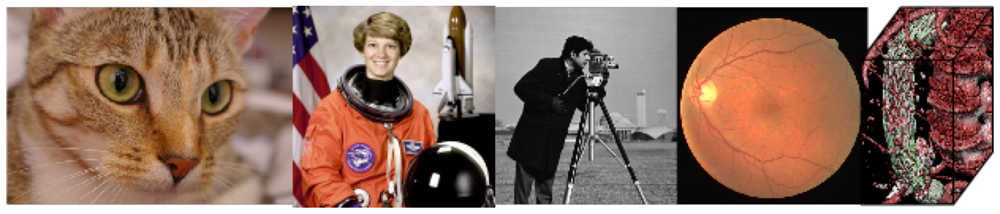

In [ ]:
# Calling the plot function defined earlier to display the image
plot(im)

In [ ]:
# Loading the pre-trained AlexNet model and moving it to the GPU (CUDA device 0)
net = alexnet(pretrained=True).cuda(0)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Define the normalization transformation
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406], # Mean values for each channel
   std=[0.229, 0.224, 0.225] # Standard deviation values for each channel
)
# Define a sequence of preprocessing transformations
preprocess = transforms.Compose([
   transforms.Resize(256), # Resize the image to 256x256 pixels
   transforms.CenterCrop(224), # Crop the center 224x224 region of the image
   transforms.ToTensor(), # Convert the image to a PyTorch tensor
   normalize # Apply the normalization transformation
])

Doc Block: The provided code defines a sequence of preprocessing transformations commonly used in image processing tasks with PyTorch's torchvision library. First, the `normalize` transformation is defined, which standardizes the image data by subtracting the mean values `[0.485, 0.456, 0.406]` and dividing by the standard deviation values `[0.229, 0.224, 0.225]` for each color channel. This normalization step helps in preparing the data for model training by centering and scaling the pixel values. Next, the `preprocess` sequence is defined using `transforms.Compose`, which combines several transformations into a single callable. This sequence includes resizing the image to 256x256 pixels, cropping the center to 224x224 pixels, converting the image to a PyTorch tensor, and finally applying the normalization transformation. These preprocessing steps ensure that the input images are appropriately formatted and normalized for use with PyTorch models, particularly neural networks.

In [ ]:
# Reading an image from a URL using imageio
im = imageio.imread('https://static0.gamerantimages.com/wordpress/wp-content/uploads/2024/04/minecraft-village-logo.jpg?q=70&fit=contain&w=943&h=&dpr=1')

<ipython-input-7-8ea7f627bd9f>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://static0.gamerantimages.com/wordpress/wp-content/uploads/2024/04/minecraft-village-logo.jpg?q=70&fit=contain&w=943&h=&dpr=1')


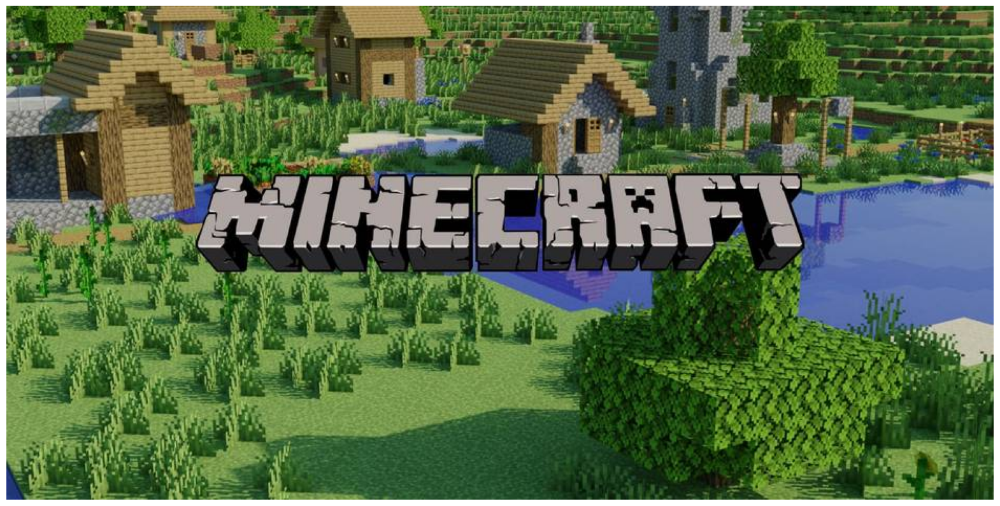

In [ ]:
# Displaying the image using the previously defined plot function
plot(im)

In [ ]:
# Converting the NumPy array 'im' to a PIL Image object
image = Image.fromarray(im) #convert to pil

In [ ]:
# Applying the preprocessing transformations defined earlier to the PIL Image object 'image'
img_tensor = preprocess(image)

In [ ]:
# Adding an extra dimension to the tensor to create a batch of size 1
img_tensor = img_tensor.unsqueeze_(0)

In [ ]:
# This command returns the shape of the img_tensor tensor, which represents the preprocessed image.
# The shape is [1, 3, 224, 224], where:
# - 1 is the batch size (1 image in the batch)
# - 3 is the number of channels (RGB)
# - 224x224 is the resolution of the image
img_tensor.shape

torch.Size([1, 3, 224, 224])

In [ ]:
# Creating a PyTorch tensor from img_tensor and moving it to the GPU (CUDA device 0)
img_variable = torch.tensor(img_tensor).cuda(0)

<ipython-input-13-77b980c068b8>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
# Passing the preprocessed image tensor 'img_variable' through the AlexNet model 'net' to get the output
out = net(img_variable)

In [ ]:
# Converting the output tensor 'out' to a NumPy array, moving it to the CPU and getting the index of the maximum value
label_index = out.cpu().data.numpy().argmax()

In [ ]:
# The variable 'label_index' contains the index of the predicted class label for the input image
label_index

698

In [ ]:
# Sorting the output probabilities and selecting the top 10 classes
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

In [ ]:
# URL to fetch the class labels
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [ ]:
# Fetching the class labels from the URL and converting them to a dictionary
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}

In [ ]:
# Printing the predicted class label for the input image
print(labels[label_index])

palace


In [ ]:
# Printing the top 10 predicted class labels for the input image
for i in range(10):
    print(labels[top_list[i]])

palace
park bench
jigsaw puzzle
castle
shovel
lakeside, lakeshore
street sign
viaduct
thatch, thatched roof
picket fence, paling


Doc Block: This code snippet prints the top 10 predicted class labels for an input image. Assuming labels is a list or array containing the class labels and top_list is a list or array containing the indices of the top predicted classes, the code iterates over the range of 10 and prints the corresponding class labels using the indices from top_list. Each iteration prints one class label.

In [ ]:
# Displaying the architecture of the AlexNet model
net

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
# Summarizing the AlexNet model architecture with input shape (3, 224, 224)
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
# Extracting the output of the first convolutional layer of the AlexNet model and converting it to a NumPy array
out = net.features[0](img_variable).cpu().detach().numpy()

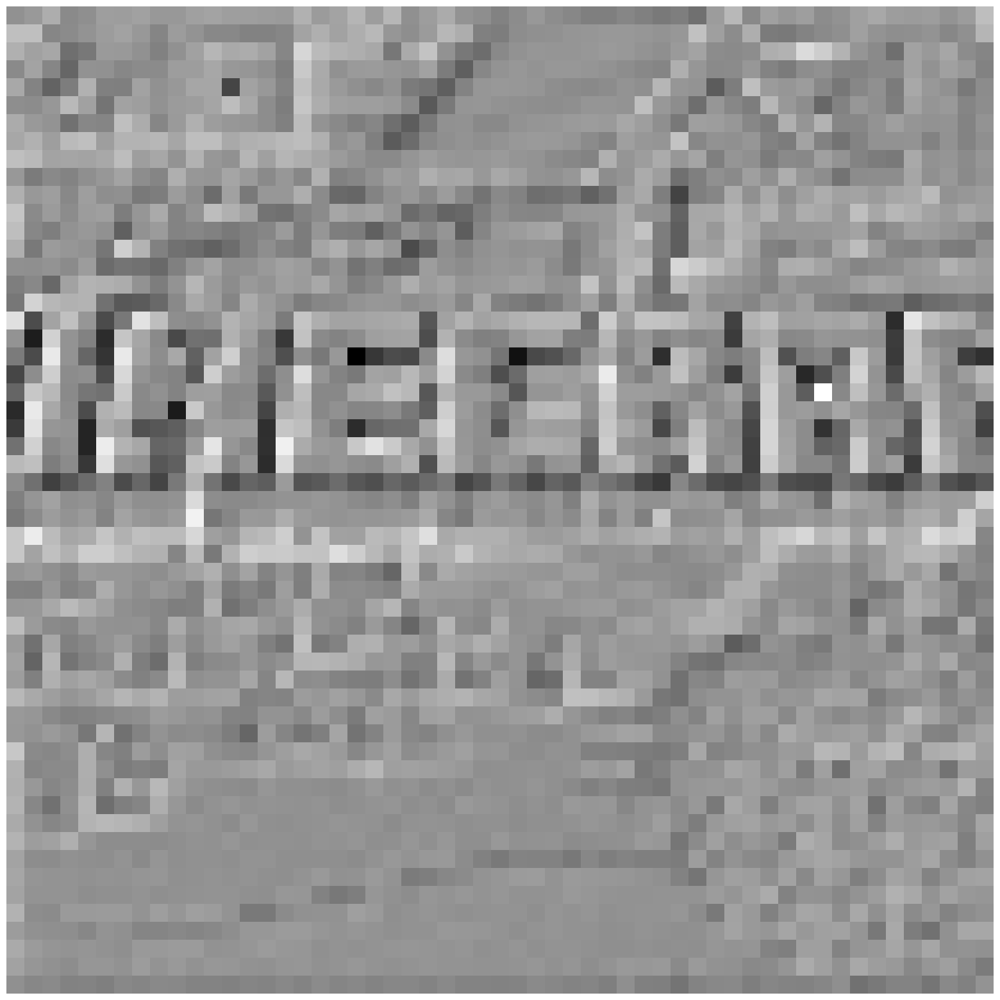

In [ ]:
# Plotting the output of the first convolutional layer
plot(out[0,0,:,:])

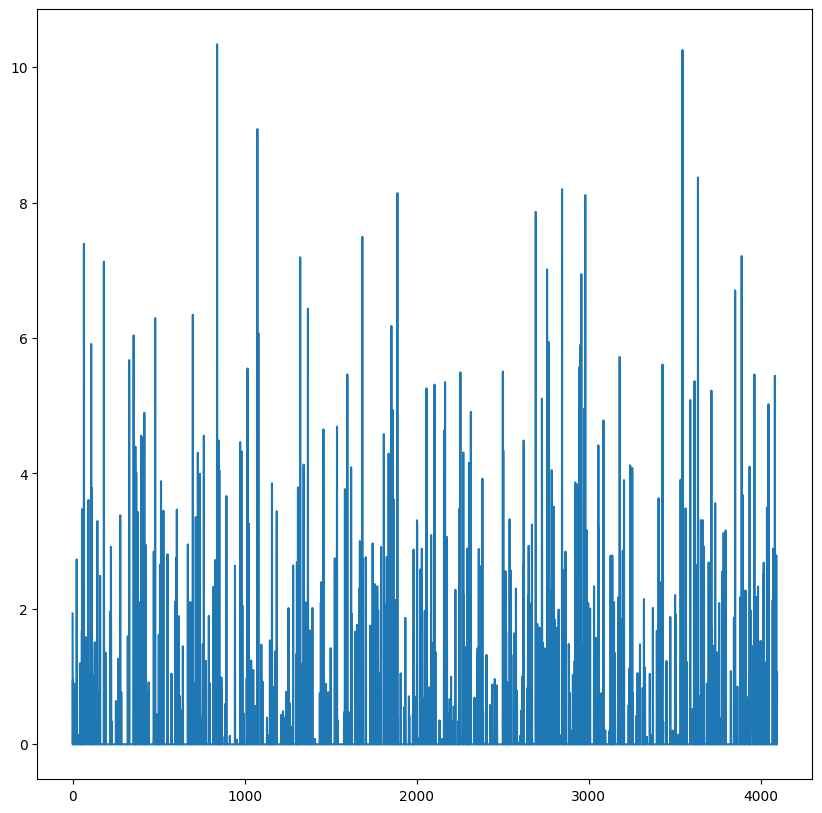

In [ ]:
# Plotting the output of the first 6 layers of the classifier in the AlexNet model
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
# Setting the size of the plot
fig = plt.gcf()
fig.set_size_inches(10, 10)

Doc Block: This code plots the output of the first 6 layers of the classifier in an AlexNet model. It first computes the output of the first 13 layers of the AlexNet model, up to the average pooling layer, for an input image `img_variable`. This output is then flattened. The code then selects the first 6 layers of the classifier part of the AlexNet model and plots the output values against indices ranging from 0 to 4095. Finally, the size of the plot is set to 10x10 inches. It's important to note that this code assumes `net` is an instance of the AlexNet model and `img_variable` is a PyTorch tensor representing an input image.

In [ ]:
# Reading an image from a URL using imageio
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


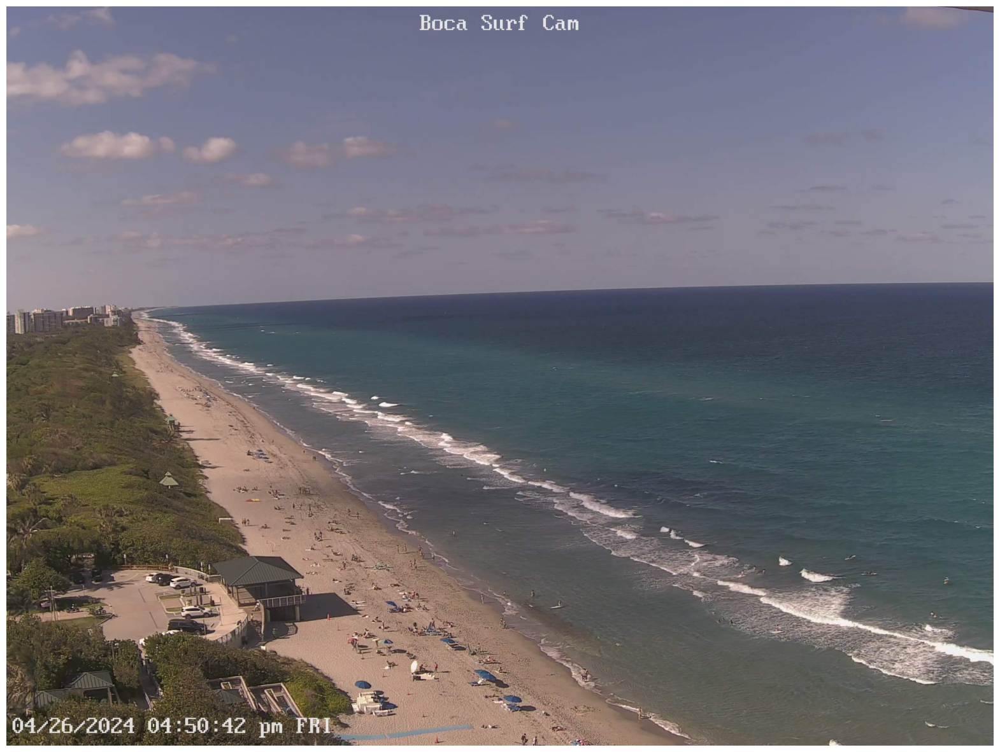

In [ ]:
# Displaying the image
plot(im)

In [ ]:
# Define a function to load and preprocess an image for the model
def load_im(im):
    # Convert the NumPy array 'im' to a PIL Image object
    image = Image.fromarray(im) #convert to pil
    # Apply the preprocessing transformations to the PIL Image object
    img_tensor = preprocess(image)
    # Add an extra dimension to create a batch of size 1
    img_tensor = img_tensor.unsqueeze_(0)
    # Convert the preprocessed image tensor to a PyTorch tensor and move it to the GPU
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

Doc Block: The `load_im(im)` function preprocesses an input image `im` for a PyTorch model. It first converts the NumPy array `im` into a PIL Image object using `Image.fromarray(im)`. Then, the function applies a sequence of preprocessing transformations to the PIL Image object, including resizing, center cropping, converting to a tensor, and normalization. After preprocessing, an extra dimension is added to the image tensor to create a batch of size 1 using `img_tensor.unsqueeze_(0)`. Finally, the preprocessed image tensor is converted to a PyTorch tensor and moved to the GPU using `.cuda(0)`. The function returns the preprocessed image tensor ready for use in model inference.

In [ ]:
# Using the load_im function to preprocess the image 'im' and pass it through the AlexNet model 'net'
out = net(load_im(im))

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
# Define a function for running inference on an image
def inference(im):
    # Pass the image through the AlexNet model
    out = net(load_im(im))
    # Get the index of the predicted class label
    label_index = out.cpu().data.numpy().argmax()
    # Get the indices of the top 10 predicted class labels
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    # Print the predicted class label
    print(labels[label_index])
    print('____')
    # Print the top 10 predicted class labels
    for i in range(10):
        print(labels[top_list[i]])

Doc Block: The `inference(im)` function performs inference on an input image `im` using the AlexNet model. It first preprocesses the image using the `load_im(im)` function, which converts the image to a PyTorch tensor and moves it to the GPU. The preprocessed image is then passed through the AlexNet model (`net`), and the output logits are obtained. The function processes the output logits by converting them to a NumPy array and moving them to the CPU. It then determines the index of the predicted class label using `argmax()` and finds the indices of the top 10 predicted class labels using `np.argsort()` and `np.flip()`. Finally, the function prints the predicted class label, a separator (`'____'`), and the top 10 predicted class labels. This function provides a convenient way to run inference on an image using the AlexNet model and display the predicted class labels.

In [ ]:
# Run the inference function on the image 'im'
inference(im)

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
breakwater, groin, groyne, mole, bulwark, seawall, jetty
sandbar, sand bar
lakeside, lakeshore
dam, dike, dyke
volcano
valley, vale
cliff, drop, drop-off
wing


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
%%capture
!pip install wandb  # Install the Weights & Biases library
!apt-get install poppler-utils  # Install Poppler utilities for PDF processing
!pip install pdf2image  # Install the pdf2image library for PDF conversion
!pip install flashtorch  # Install the flashtorch library for visualizing neural networks
import requests  # Import the requests library for making HTTP requests
from pdf2image import convert_from_path  # Import the convert_from_path function from pdf2image
import matplotlib.pyplot as plt  # Import matplotlib for plotting
import numpy as np  # Import numpy for numerical computations
import torch  # Import torch for deep learning framework
import requests  # Import requests for making HTTP requests
from torchvision import *  # Import all modules from torchvision
from torchvision.models import *  # Import all models from torchvision.models
from flashtorch.utils import apply_transforms  # Import apply_transforms function from flashtorch.utils
import wandb as wb  # Import the wandb module as wb for Weights & Biases

In [ ]:
def GPU(data):
    ##Create a PyTorch tensor on the GPU with gradient tracking enabled.

    ##Args:- data: The input data to be converted to a PyTorch tensor.

    ##Returns:- torch.Tensor: A PyTorch tensor on the GPU with gradient tracking enabled.
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    #Create a PyTorch tensor on the GPU without gradient tracking.

    #Args: data: The input data to be converted to a PyTorch tensor.

    #Returns: torch.Tensor: A PyTorch tensor on the GPU without gradient tracking.

    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

Doc Block: The GPU(data) function converts the input data into a PyTorch tensor, setting requires_grad=True to enable tracking of computation history for gradient computation, dtype=torch.float to specify the data type as float, and device=torch.device('cuda') to move the tensor to the GPU for computation. This function is suitable for scenarios where gradients need to be computed and the tensor is required to be on the GPU.

On the other hand, the GPU_data(data) function is similar but sets requires_grad=False, indicating that gradients are not computed for this tensor. This function is useful when gradients are not needed, such as during inference or when memory efficiency is crucial. Using these functions ensures that data is appropriately handled on the GPU in PyTorch, balancing between gradient tracking and memory efficiency based on the specific requirements of the computation.

In [ ]:
def plot(x):
    # Create a figure and axis
    fig, ax = plt.subplots()
    # Display the image 'x' using a grayscale colormap
    im = ax.imshow(x, cmap='gray')
    # Turn off axis labels
    ax.axis('off')
    # Set the figure size to 5x5 inches
    fig.set_size_inches(5, 5)
    # Show the plot
    plt.show()

Doc Block: The `plot(x)` function is a utility for displaying grayscale images represented by a 2D array `x`. It initializes a Matplotlib figure and axis using `plt.subplots()`, then uses `ax.imshow(x, cmap='gray')` to display the image in grayscale. The function turns off the axis labels with `ax.axis('off')` to focus solely on the image. Additionally, it sets the size of the figure to 5x5 inches using `fig.set_size_inches(5, 5)`. Finally, the function shows the plot using `plt.show()`. This function is useful for quickly visualizing grayscale images in a compact and easily readable format.

In [ ]:
def get_google_slide(url):
    # Extract the presentation ID from the URL
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    # Return the URL for exporting the presentation as PDF
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    # Get the PDF file from the Google Slide URL
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    # Convert the PDF to a list of PIL Image objects
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):
    # Apply transformations to the image and move it to the specified device
    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Doc Block: These functions form a workflow to extract slides from a Google Slides presentation, convert them into images, and prepare these images for processing with a neural network model. The get_google_slide(url) function takes a Google Slides URL, extracts the document ID and page ID, and constructs a new URL for exporting the slide as a PDF. The get_slides(url) function utilizes get_google_slide(url) to fetch the PDF URL, downloads the PDF file, and converts it into a list of PIL Image objects. Finally, the load(image) function applies transformations to the input image, enables gradient tracking, and moves it to the appropriate device (GPU if available, otherwise CPU). This workflow enables the extraction, conversion, and preprocessing of slides from a Google Slides presentation for further analysis or processing with a neural network model.

In [ ]:
# Fetch the labels from a JSON file hosted on Amazon S3 and convert them to a dictionary
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

In [ ]:
# Load the AlexNet model with default weights and move it to the specified device
model = alexnet(weights='DEFAULT').to(device)
# Set the model to evaluation mode
model.eval();

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 95.2MB/s]


In [ ]:
url = "https://docs.google.com/presentation/d/1G6ad58Pjhd8cSt7Z9kLHH_hZeM8ScgQ5KaWhh_Ba2mw/edit#slide=id.g2d00ac430ba_0_157"

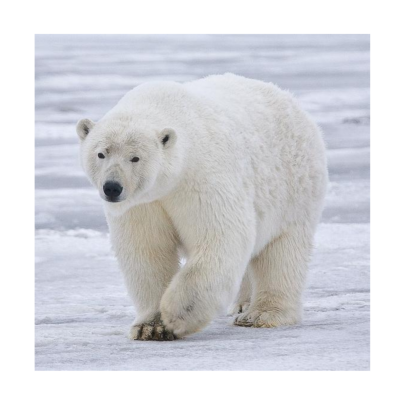

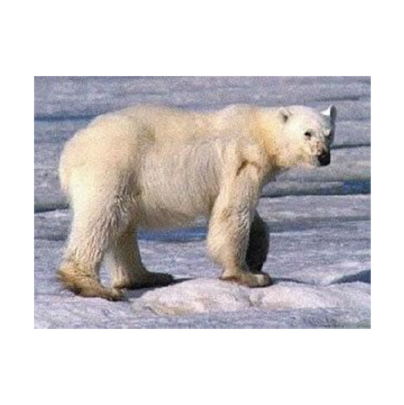

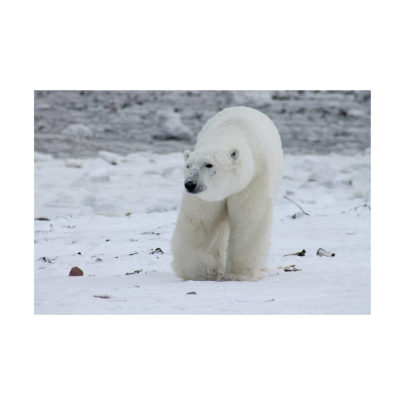

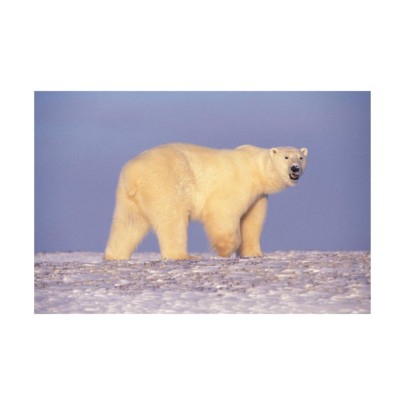

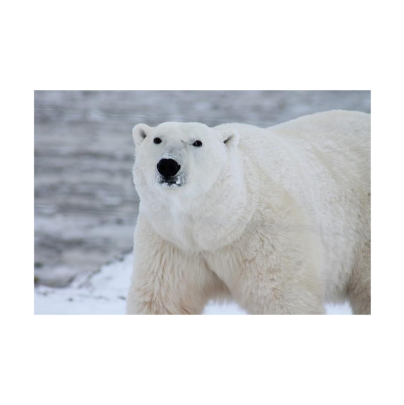

...

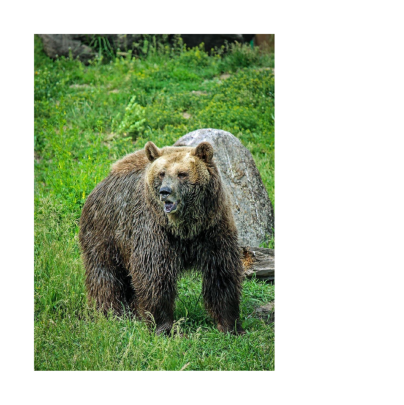

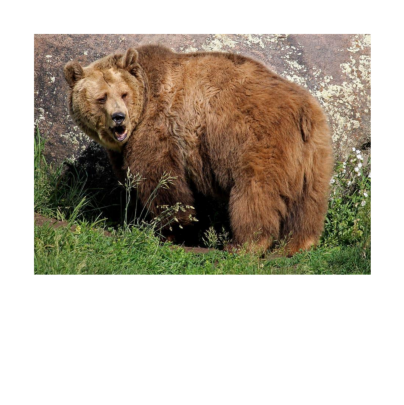

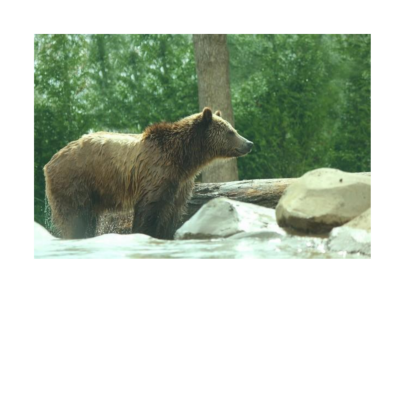

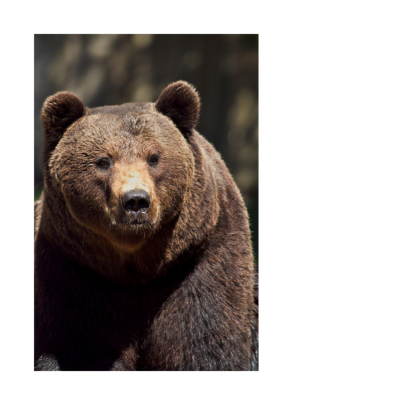

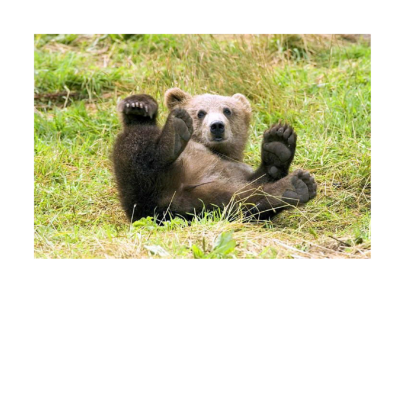

In [ ]:
images = []  # Initialize an empty list to store processed images

# Iterate over images obtained from the Google Slide URL
for image in get_slides(url):
    plot(image)  # Display the image using the plot function
    images.append(load(image))  # Preprocess and load the image, then append it to the list

# Convert the list of images into a single tensor by vertically stacking them
images = torch.vstack(images)

Doc Block: The code iterates over a list of images obtained from a Google Slides presentation specified by the URL. For each image, it plots the image using the `plot` function, which displays the image. Then, it applies transformations and loads the image using the `load` function, converting it into a format suitable for processing with a PyTorch model. The processed images are appended to a list `images`. Finally, the list of processed images is converted into a single tensor using `torch.vstack`, creating a tensor where each row corresponds to an image. This tensor can then be used as input to a PyTorch model for further processing or inference.

In [ ]:
# Check the shape of the images tensor
images.shape

torch.Size([50, 3, 224, 224])

In [ ]:
# Pass the images tensor through the model to obtain the output
model(images)

tensor([[-4.8745e+00, -6.8367e+00, -2.1211e+00,  ..., -6.6248e+00,
          2.3165e+00,  6.2280e+00],
        [-5.4417e-01, -6.2329e+00, -4.4012e-01,  ..., -1.4285e+00,
          1.1774e+00,  4.7364e-01],
        [-5.2718e+00, -7.2400e+00, -8.3096e-01,  ..., -7.2848e+00,
         -1.4932e+00,  5.3711e+00],
        ...,
        [ 5.7681e-01, -3.9671e+00, -2.3197e-01,  ...,  2.4848e+00,
          1.8879e+00,  4.4556e-01],
        [-4.4011e+00, -6.8770e+00, -2.1239e+00,  ...,  2.1082e+00,
          1.7096e+00, -9.6966e-04],
        [-4.9312e+00, -6.4305e+00, -2.7293e+00,  ..., -2.6088e+00,
         -2.6265e-01,  9.3312e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
# Perform inference on the images using the model and store the output in y
y = model(images)

In [ ]:
# Check the shape of the output tensor y
y.shape

torch.Size([50, 1000])

In [ ]:
# Find the indices of the maximum values along the second dimension of y (class predictions)
# Convert the result to a NumPy array and move it to the CPU
guesses = torch.argmax(y, 1).cpu().numpy()

In [ ]:
# Iterate over the list of class predictions (indices) in guesses
for i in list(guesses):
    # Print the corresponding label for each class prediction
    print(labels[i])

ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
gibbon, Hylobates lar
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
ice bear, polar be

Doc Block:  This code iterates over the list of class predictions `guesses`, which are indices corresponding to the predicted classes for each image. For each index `i`, it retrieves the corresponding label from the `labels` dictionary and prints it. This allows you to see the predicted class labels for each image in the Google Slides presentation.

In [ ]:
# Create a NumPy array Y of length 50 filled with zeros
Y = np.zeros(50,)
# Set the values of Y from index 25 onwards to 1
Y[25:] = 1

In [ ]:
# Display the array Y
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
# Detach the output tensor y from the computation graph and move it to the CPU, then convert it to a NumPy array
X = y.detach().cpu().numpy()

In [ ]:
# Check the shape of the array X
X.shape

(50, 1000)

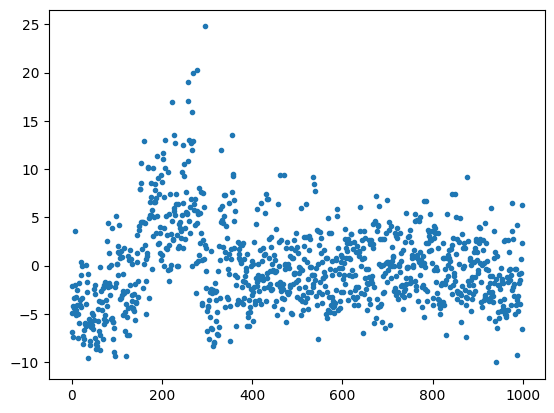

In [ ]:
# Plot the values of the first row of X using dots
plt.plot(X[0],'.')

Doc Block: This code plots the values in the first row of the array X against their indices. The '.' argument specifies that the points should be plotted as individual dots rather than a connected line.

In [ ]:
# Display the values in the first row of array X
X[0]

array([-4.87447119e+00, -6.83667898e+00, -2.12106490e+00, -7.43703222e+00,
       -4.16005754e+00, -4.36236382e+00, -3.31730509e+00, -2.02399898e+00,
        3.59206080e+00, -4.57893419e+00, -3.22269106e+00, -5.08492184e+00,
       -4.11664152e+00, -2.49835753e+00, -4.99693584e+00, -7.54413223e+00,
       -5.99223375e+00, -1.77965879e+00, -3.52784944e+00, -4.06782150e+00,
       -4.26477623e+00, -9.86253142e-01,  3.27029526e-01, -2.61049271e-02,
       -3.37126231e+00, -7.25748825e+00, -8.15825272e+00, -7.56450462e+00,
       -6.67990208e+00, -6.02472734e+00, -5.96979666e+00, -4.02217102e+00,
       -6.28481579e+00,  1.84063613e-02, -1.70739079e+00, -2.71001387e+00,
       -9.04729843e-01, -9.58287239e+00, -5.90684128e+00, -5.58721972e+00,
       -7.78409910e+00, -8.25449371e+00, -5.92703485e+00, -5.84834385e+00,
       -6.38430977e+00, -6.19506979e+00, -4.88273144e+00, -6.53204250e+00,
       -5.15522432e+00, -5.63104963e+00, -2.48092961e+00, -2.95869303e+00,
       -1.98465455e+00, -

Doc Block: This code retrieves and displays the values in the first row of the array X. Each value represents the output of the model for a specific class for the corresponding input image.

In [ ]:
# Find the index of the maximum value in the first row of array X
np.argmax(X[0])

296

In [ ]:
# Access the label corresponding to class index 948 from the labels dictionary
labels[948]

'Granny Smith'

In [ ]:
# Find the indices of the top 10 largest values in the array X[0] (descending order)
top_ten = np.argsort(X[0])[::-1][0:10]

In [ ]:
# Iterate over the indices in top_ten and print the corresponding labels
for i in top_ten:
    print(labels[i])

ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
Arctic fox, white fox, Alopex lagopus
white wolf, Arctic wolf, Canis lupus tundrarum
Samoyed, Samoyede
Great Pyrenees
kuvasz
standard poodle
komondor
weasel
chow, chow chow


Doc Block: This code prints the labels corresponding to the top 10 predicted classes for the first image in the Google Slides presentation, based on the model's output stored in the array X[0].

In [ ]:
# Display the labels dictionary
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

Comment: This code simply displays the labels dictionary, which contains the mapping of class indices to class labels. Each key-value pair in the dictionary represents a class index and its corresponding class label, allowing for easy interpretation of model predictions.

(array([ 42., 213., 327., 252., 108.,  37.,  14.,   3.,   3.,   1.]),
 array([-10.04496193,  -6.56246758,  -3.07997322,   0.40252113,
          3.88501549,   7.36750984,  10.8500042 ,  14.33249855,
         17.8149929 ,  21.29748726,  24.77998161]),
 <BarContainer object of 10 artists>)

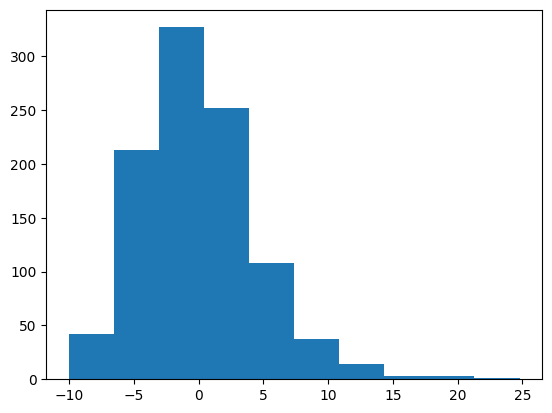

In [ ]:
# Create a histogram of the values in the array X[0], showing the distribution of class scores
plt.hist(X[0])

In [ ]:
# Convert the arrays X and Y to PyTorch tensors and move them to the GPU
X = GPU_data(X)
Y = GPU_data(Y)

In [ ]:
# Compute the softmax function for the input tensor x
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None]) # Subtract the maximum value along each row from x and exponentiate
    s = s1 / s1.sum(1)[:,None] # Divide each element by the sum of elements along each row
    return s

In [ ]:
# Compute the cross-entropy loss between the model outputs and the true labels
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [ ]:
# Generate random numbers from a truncated normal distribution of the specified size
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2) # Generate uniform random numbers in a specific range
    u2 = torch.rand(size) # Generate another set of uniform random numbers
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2) # Compute the truncated normal random numbers


    return z

Doc Block: The `Truncated_Normal(size)` function generates samples from a truncated normal distribution. It first generates two uniform random variables `u1` and `u2`, with `u1` scaled to be between `exp(-2)` and `1`. It then computes a standard normal random variable `z` using the Box-Muller transform, where `z` is the square root of `-2 * log(u1)` multiplied by `cos(2 * pi * u2)`. This process ensures that `z` follows a standard normal distribution. Since `u1` is truncated to the range `(exp(-2), 1)`, `z` effectively represents samples from a truncated normal distribution with a mean of 0 and a standard deviation of 1, truncated at `exp(-2)`.

In [ ]:
# Compute the accuracy of the model's predictions
def acc(out,y): # Disable gradient tracking
# Compare the indices of the maximum values along the second dimension of out with y,
# and compute the average to get the accuracy
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
# Check the shape of the tensor X
X.shape

torch.Size([50, 1000])

In [ ]:
# Define a function to get a batch of data for training or testing
def get_batch(mode):
    b = c.b # Get the batch size from the configuration
    if mode == "train":
      # Randomly select a batch of data from the training set
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
      # Randomly select a batch of data from the test set
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

Doc Block: The get_batch function is used to extract a batch of input-output pairs from the dataset, depending on the specified mode ("train" or "test"). It first retrieves the batch size b from the c object. If the mode is "train," it randomly selects a starting index r within the range of the dataset size (X.shape[0] - b) and extracts a batch of input samples x and corresponding output labels y from the training dataset X and Y, respectively. Similarly, if the mode is "test," it randomly selects a starting index r within the range of the test dataset size (X_test.shape[0] - b) and extracts a batch of input samples x and corresponding output labels y from the test dataset X_test and Y_test. The function then returns the batch of input samples x and output labels y as a tuple. This function is useful for iterating over the dataset in batches during the training and testing phases of a machine learning model.

In [ ]:
def model(x,w):
# Define a simple linear model that performs matrix multiplication between the input x and the weight matrix w[0]
    return x@w[0]

In [ ]:
def make_plots():
# Compute the training accuracy of the model
    acc_train = acc(model(x,w),y)
# Log the training accuracy using Weights & Biases
    wb.log({"acc_train": acc_train})

In [ ]:
# Initialize Weights & Biases with the specified project name
wb.init(project="Linear_Model_Photo_1");
# Access the Weights & Biases config
c = wb.config

# Set the learning rate (step size) for the optimizer
c.h = 0.001
# Set the batch size for training
c.b = 4
# Set the number of epochs (iterations over the dataset)
c.epochs = 100000

    # Initialize the weight matrix w with random values
w = [GPU(Truncated_Normal((1000,2)))]
    # Define the optimizer (Adam optimizer) with the specified learning rate and weights
optimizer = torch.optim.Adam(w, lr=c.h)
    # Iterate over the specified number of epochs
for i in range(c.epochs):
    # Get a batch of training data
    x,y = get_batch('train')
    # Compute the loss (cross-entropy) using the model's output and the true labels
    loss = cross_entropy(softmax(model(x,w)),y)
    # Zero the gradients to prevent accumulation
    optimizer.zero_grad()
    # Compute the gradients of the loss w.r.t. the weights
    loss.backward()
    # Update the weights using the optimizer
    optimizer.step()

    # Log the loss using Weights & Biases
    wb.log({"loss": loss})

    # Update the training accuracy plot
    make_plots()


<IPython.core.display.Javascript object>

Doc Block: This code sets up a training loop using Weights & Biases to log the loss and training accuracy of a linear model trained on a dataset. It initializes a Weights & Biases project named "Linear_Model_Photo_1" and defines configuration parameters such as the learning rate, batch size, and number of epochs. The weight matrix is initialized as a truncated normal matrix and moved to the GPU. The Adam optimizer is used for optimization. The training loop runs for the specified number of epochs. For each epoch, a training batch is obtained, and the cross-entropy loss is computed using the model's output and the ground truth labels. The optimizer updates the weights based on the computed gradients. After each epoch, the loss is logged using Weights & Biases, and the training accuracy is computed and logged as well. This code demonstrates a basic training setup for a linear model using Weights & Biases for experiment tracking.